# Neural network for ECG analysis
Javier  Serrano Molina and Erin Christy McKiernan
Facultad de ciencias, UNAM

## Setting up the notebook

We begin by setting up the Jupyter notebook and importing the Python modules needed for plotting figures, create animations, etc. We include commands to view plots in the Jupyter notebook, and to create figures with good resolution and large labels. These commands can be customized to produce figures with other specifications.

In [1]:
# Imports python libraries
import numpy as np
import random as rd
import wave
import sys
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy.signal import butter, lfilter, filtfilt #for filtering data
from statistics import stdev
sys.path.insert(1, r'./../functions') # add to pythonpath

# commands to create high-resolution figures with large labels
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['axes.labelsize'] = 16 # fontsize for figure labels
plt.rcParams['axes.titlesize'] = 18 # fontsize for figure titles
plt.rcParams['font.size'] = 14 # fontsize for figure numbers
plt.rcParams['lines.linewidth'] = 1.4 # line width for plotting

In [2]:
#comdands needed to import the data and the metadata.
from IPython.display import display
import os
import shutil
import posixpath
import wfdb

## Defining a function to retrieve the data

We define a function called ecg that opens the recordings with a given path. The outcome is a couple of arrays that correspond to the time variable given in seconds and the data given in $\mu V$. 

In [3]:
#Function that extracts the number of recording channels, sampling rate, time and signal
#variable is the path and filename of the .wav file
def ecg(variable):
    record = wave.open(variable, 'r') # load the data

    # Get the number of channels, sample rate, etc.
    numChannels = record.getnchannels() #number of channels
    numFrames = record.getnframes() #number of frames
    sampleRate = record.getframerate() #sampling rate
    sampleWidth = record.getsampwidth()
    
    # Get wave data
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # Get time window
    timeECG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeECG, waveData

## Re-defining the previous functions

We define the functions that were obtained in the other notebooks. If there is any doubt, about how they were obtained, please review the notebook 01-Basics (for detecta_maximos_locales) or SS_ECG(for the rest of functions). 

In [4]:
def detecta_maximos_locales(timeECG, waveData, threshold_ratio=0.7):
    # If not all the R peaks are detected, lower the threshold_ratio
    # If components that are not R peaks (like T waves) are detected, higher the threshold_ratio

    if len(timeECG) != len(waveData): #Raises an error if the two arrays have different lengths
        raise Exception("The two arrays have different lengths.")
    
    interval = max(waveData) - min(waveData)
    threshold = threshold_ratio*interval + min(waveData)
    maxima = []
    maxima_indices = []
    mxs_indices = []
    banner = False
    
    for i in range(0, len(waveData)):
            
        if waveData[i] >= threshold:#If a threshold value is surpassed,
            # the indices and values are saved 
            banner = True
            maxima_indices.append(i)
            maxima.append(waveData[i])
            
        elif banner == True and waveData[i] < threshold: #If the threshold value is crossed
            # the index of the maximum value in the original array is saved
            index_local_max = maxima.index(max(maxima))
            mxs_indices.append(maxima_indices[index_local_max])
            maxima = []
            maxima_indices = []
            banner = False     

    return mxs_indices

In [5]:
#Functions to get the Q and S peaks that correspond to any given R peak
#f: array of voltages
#x0: index of an R peak.
#w: time window in which the corresponding marker will be searched

def last_min(f,x0, w=18):
    #This function searches for a minimum in the time window previous to the R peak (x0)
    #If the R peak is too close to the begining of the recording, the function will search in the available window.
    if x0<w:
        x=np.argmin(f[:x0])
        return(x+x0)
    else:
        x=np.argmin(f[x0-w:x0])
        return(x+x0-w)
def next_min(f,x0, w=18):
    #This function searches for a minimum in the time window after the R peak(x0)
    x=np.argmin(f[x0:x0+w])
    return(x+x0)


In [6]:
#Function that obtains and plots the QRS complexes in a given recording
#timeECG: Time array in seconds
#waveData: Voltage array in micro-volts$ 
#x2: Filtered voltage array after fourier transform and reconstruction
#threshold_ratio: Relative threshold. If exceded, an R peak will be searched

def QRS(timeECG,waveData,x2,threshold_ratio,fs, plot=True):
    #Seaches the indexes of R peaks in the filtered signal
    mxs_indices = detecta_maximos_locales(timeECG[2:], x2[2:],threshold_ratio)
    
    #Empty arrays are declared for the indexes of QRS markers
    Q=[]
    R=[]
    S=[]
    #Array of lenghtds from individual QRS complexes
    qrs_lenght=[]
    
    #For every R peak, the QRS complex is identified and saved
    for r in mxs_indices:
        r+=2
        Q.append(last_min(waveData,r,w=int(fs*0.08)))
        S.append(next_min(waveData,r,w=int(fs*0.08)))
        qrs_lenght.append((S[-1]-Q[-1])/fs)
        qrs_complex=waveData[Q[-1]:S[-1]]
        if S[-1]>Q[-1]+1:
            R.append(np.argmax(qrs_complex)+Q[-1])
    #An array of results is declared
    r=[np.mean(qrs_lenght),np.max(qrs_lenght),np.min(qrs_lenght),np.std(qrs_lenght)]
    
    # Plotting EMG signal
    if plot:
        plt.figure(figsize=(18,6))
        plt.xlabel(r'time (s)')
        plt.ylabel(r'voltage ($\mu$V)')
        plt.plot(timeECG,waveData, 'b')
        #plt.plot(timeECG,2*x2.real,'g')
        plt.scatter(timeECG[R], waveData[R], color='r')
        plt.scatter(timeECG[Q], waveData[Q], color='g')
        plt.scatter(timeECG[S], waveData[S], color='m')
        #plt.xlim(timeECG[0],timeECG[0]+4)
        plt.title(file.split("/")[1]+"- "+str(int(timeECG[0]//20)))
        plt.show();
    return Q,R,S,r

In [7]:
#The recording is obtained from the file path and filtered using the fast Fourier transform(fft)
#file: File path
#fm: Frecuency minimum. Components of low frequency are deleted.
#fM: Frecuency maximum. Components of high frecuency are deleted.
#threshold_ratio: Relative threshold that if surpased, an R peak will be searched. 
#r: Array of results. Every result corresponds to a sample.
#Every sample has 7 values: mean qrs lenght, max qrs lenght, min qrs lenght, mean heart rate, heart reate std, max heart rate, min heart rate.

def R_fourier(file,fm,fM,threshold_ratio=0.7,plot=True):
    record = wfdb.rdrecord(file, sampto = 15000)
    waveData = record.p_signal[:,0]
    timeECG = np.array([i/record.fs for i in range(0, len(waveData))])
    
    #The Fourier transform is generated through the fft function
    X=np.fft.fft(waveData)
    N = len(X)
    n = np.arange(N)
    T = N*(timeECG[1]-timeECG[0])
    freq = n/T
    
    #The Foruier transform is filtered and the function is reconstructed using the inverse fast fourier transform(ifft)
    xc=X.copy()
    xc[freq<fm]=0
    xc[freq>fM]=0
    x2=np.fft.ifft(xc)
    
    #Spliting in segments of 20s
    #tt: Total time
    tt=timeECG[-1]
    #spm: Samples per measurment
    spm=int(tt//20)
    r=[]
    
    #for every sample, the corresponding analysis is made
    for i in range(0,spm):
        spm_i=i*record.fs*20
        spm_f=spm_i+record.fs*20
        Q,R,S,a=QRS(timeECG[spm_i:spm_f],waveData[spm_i:spm_f],x2[spm_i:spm_f],threshold_ratio,record.fs,plot=plot)
        hr=[]
        
        for j in range(1,len(R)):
            heart_rate=60/(timeECG[R[j]]-timeECG[R[j-1]])
            hr.append(heart_rate)
        r.append([a[0],a[1],a[2],np.mean(hr),np.std(hr),np.max(hr),np.min(hr)])
    
    return(r)

## QRS complex: Normal vs Arrythmia
Using the set of data previously imported and analyzed in the past notebooks we will find the QRS complex and analyze it. Based on previous observations we would expect to be able to identify arrythmias from the R-R segment variation and QRS complex duration.

In [8]:
#All the files corresponding to patients with arrhythmia are imported, graphed and analyzed
file=open("mit-bih-arrhythmia-database-1.0.0/RECORDS","r")
a=file.read()
b=a.split(a[3])
b.pop()
b=np.array(b)
ra=[[0.1,0.1,0.1,60,6,60,60]]
#Notice that some recordings were erased
for record in b[[0,1,3,5,6,11,12,14,15,16,19,21,22,24,26,27,30,32,33,35,36,37,38,41,42,43,44,45,47]]:
#for record in b:
    file="mit-bih-arrhythmia-database-1.0.0/"+record
    ra=np.append(ra,R_fourier(file,5,35,threshold_ratio=0.7,plot=False),axis=0)
ra=np.delete(ra,[0],axis=0)
ra=np.delete(ra,[28,38,47,48,54],axis=0)

/Users/javierserranomolina/miniconda3/envs/IA/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: divide by zero encountered in double_scalars
/Users/javierserranomolina/miniconda3/envs/IA/lib/python3.7/site-packages/numpy/core/_methods.py:202: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


| Discrimination criteria | Normal samples | Arrythmia samples |
| --- | --- | --- |
| QRS complex not clear | 19088-A(13), 19088-B(13), 19090-A(14), 19090-B(14), 19090-E(14), 19093-A(15), 19093-B(15), 19114-A(16), 19114-B(16) | 104(4),108(8), 122(20), 200(23), 207-A(28), 208(29), 221(39) |
| Deformed QRS complex | 16483-E(4), 16539-B(5), 16786-C(7), 18184-A(12), 18184-B(12), 18184-C(12), 18184-D(12) | 102(2), 107(7), 108(8), 111(10),114(13), 118(17), 119(18), 202(25) |
| Noise Excess/Artifacts in sample | 16272-A(1), 16273-B(2), 16795-A(8), 16795-C(8), 18177-C(11), 19830(17) | 104(4), 109(9), 203-A(26), 207(28), 210-A(31), 214(34), 222(40), 223-B(41), 228-A(42), 232-A(45), 233(46)  |

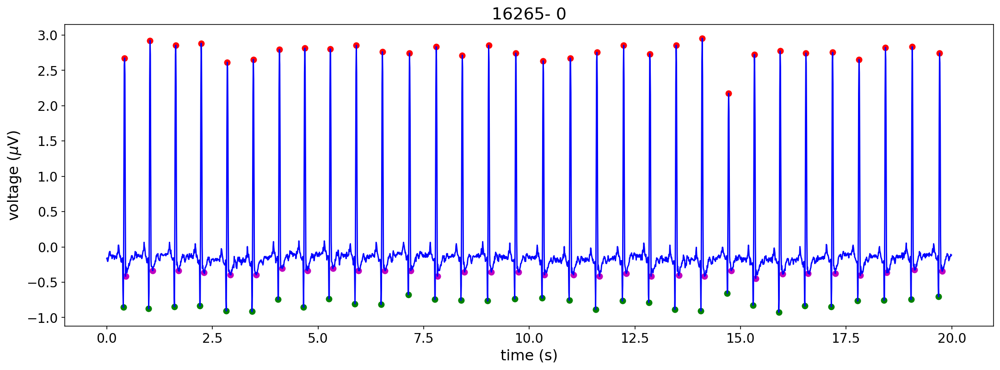

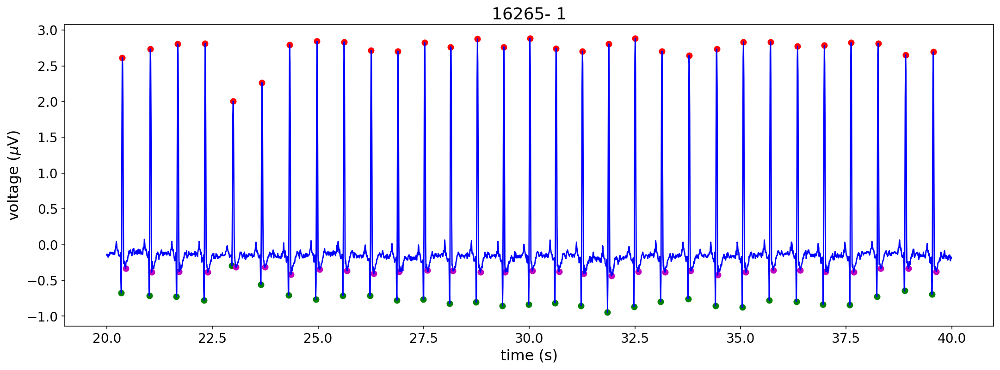

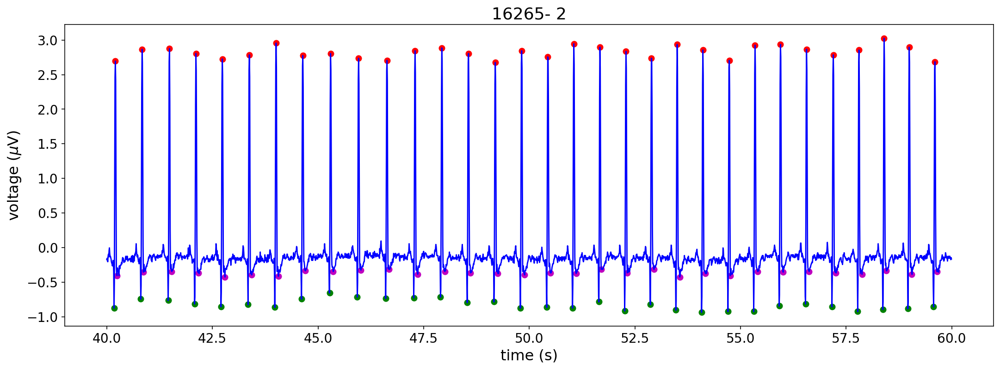

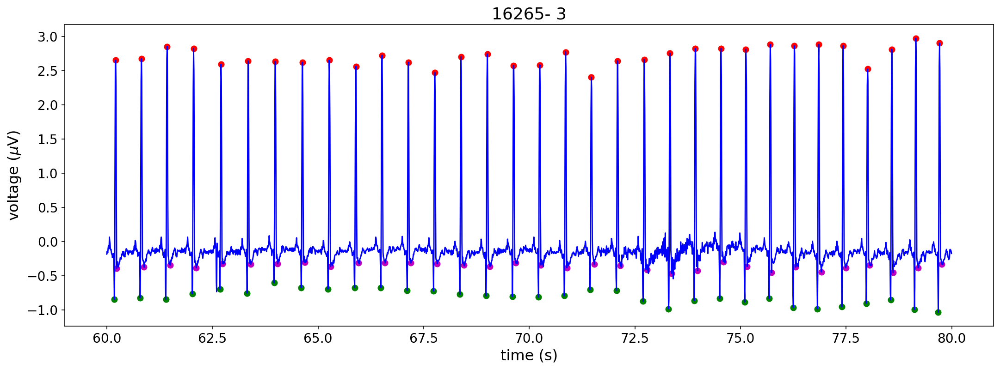

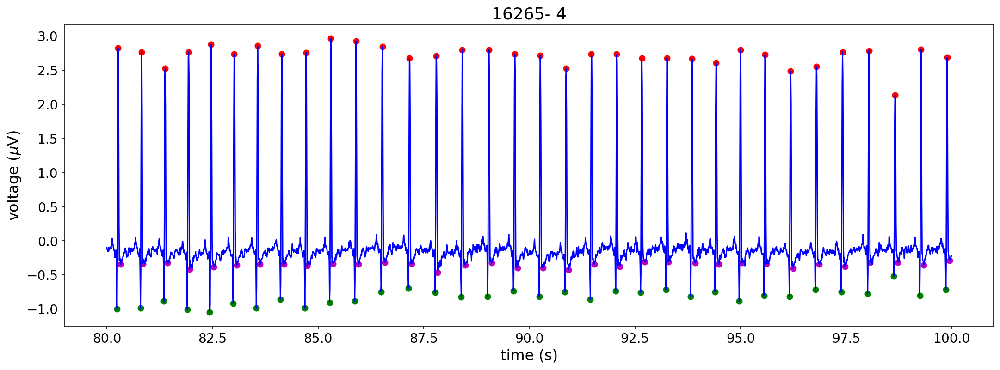

...

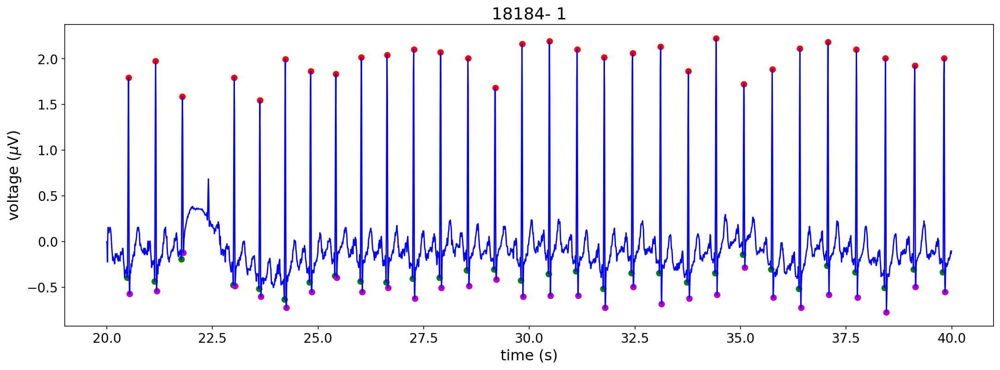

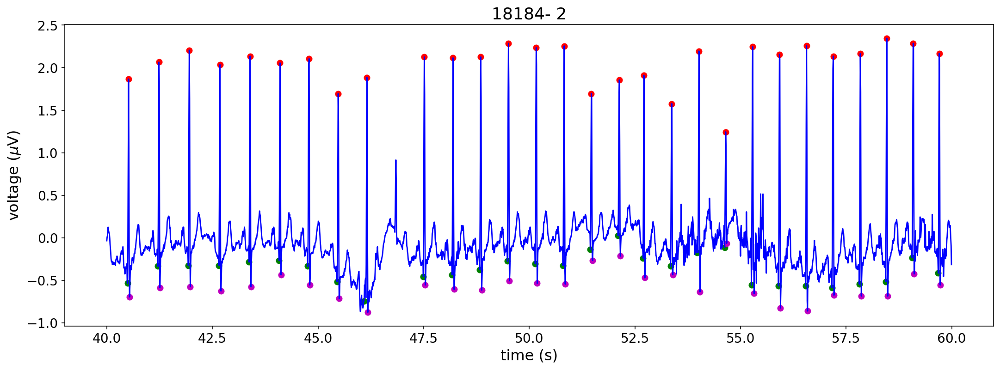

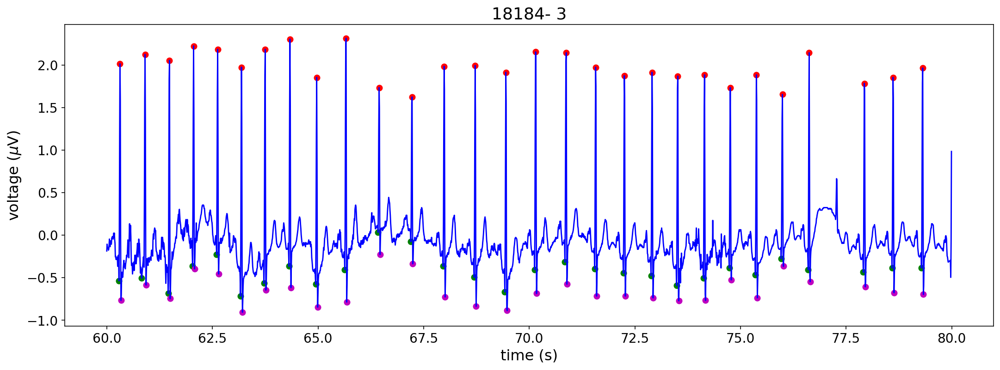

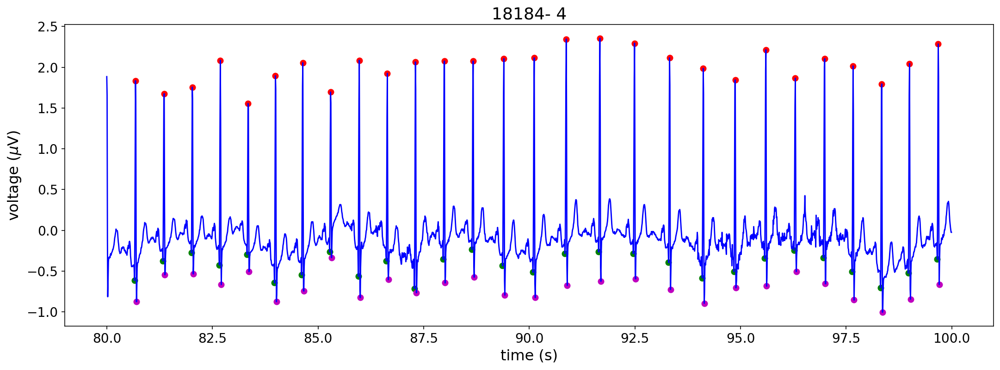

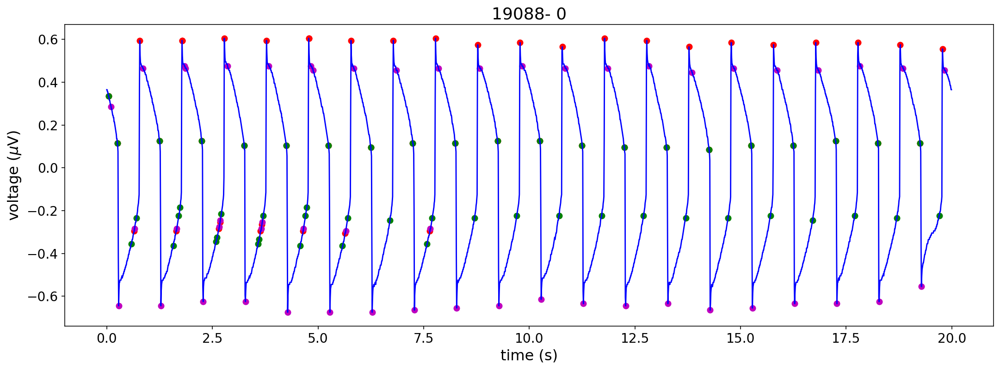

/Users/javierserranomolina/miniconda3/envs/IA/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: divide by zero encountered in double_scalars
/Users/javierserranomolina/miniconda3/envs/IA/lib/python3.7/site-packages/numpy/core/_methods.py:202: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


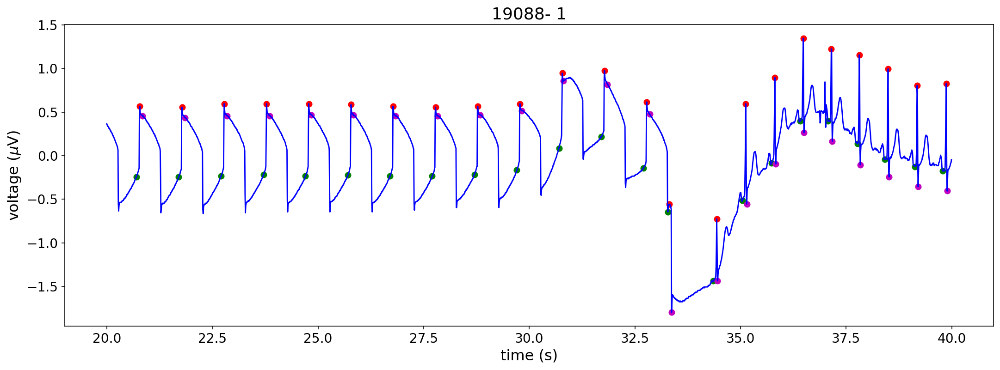

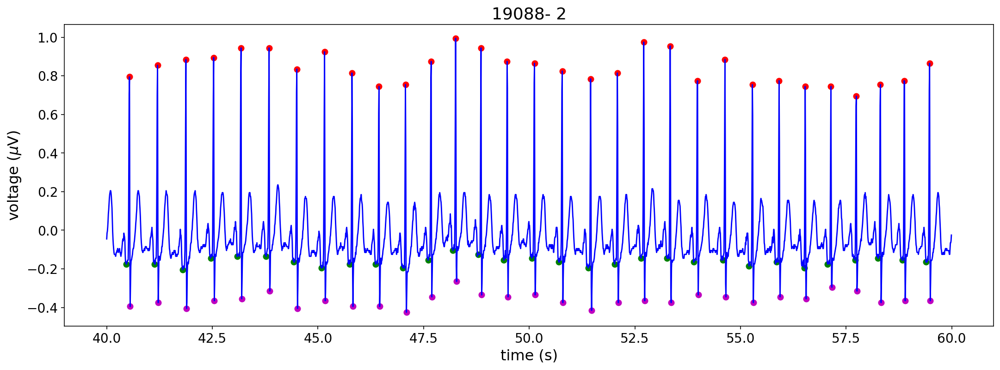

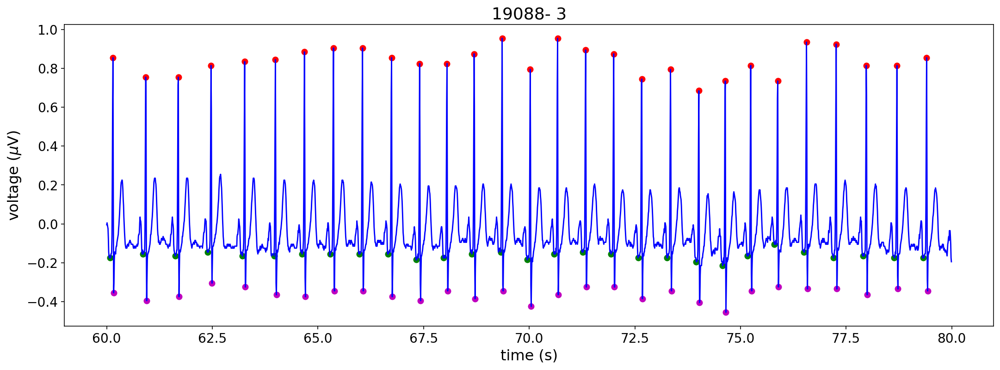

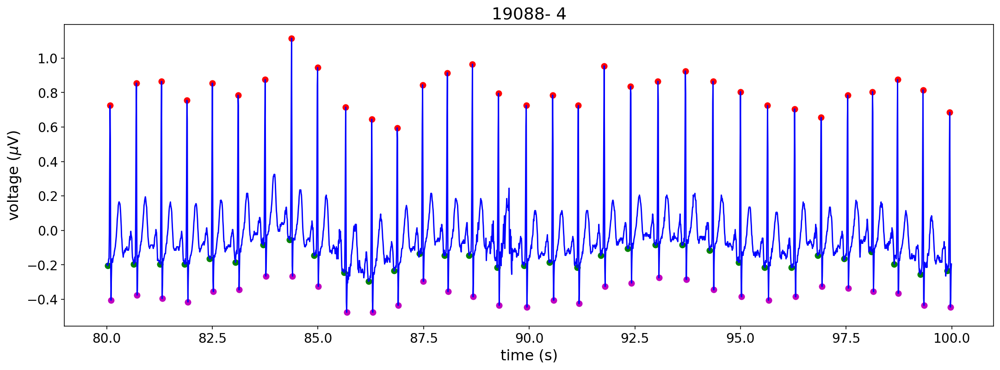

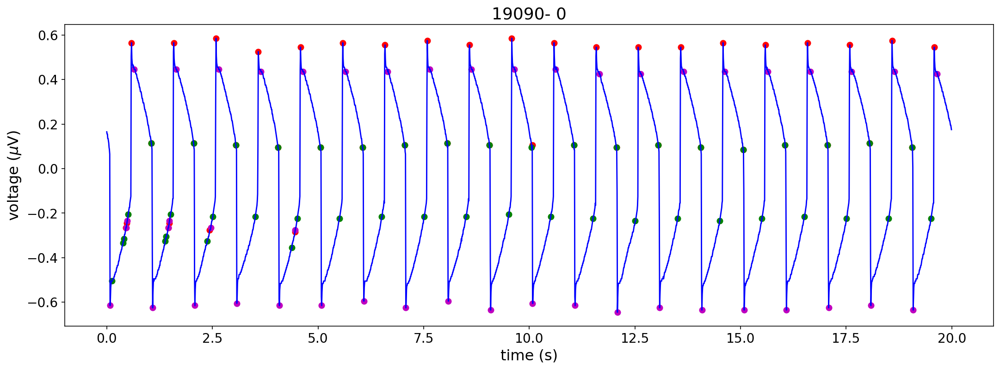

...

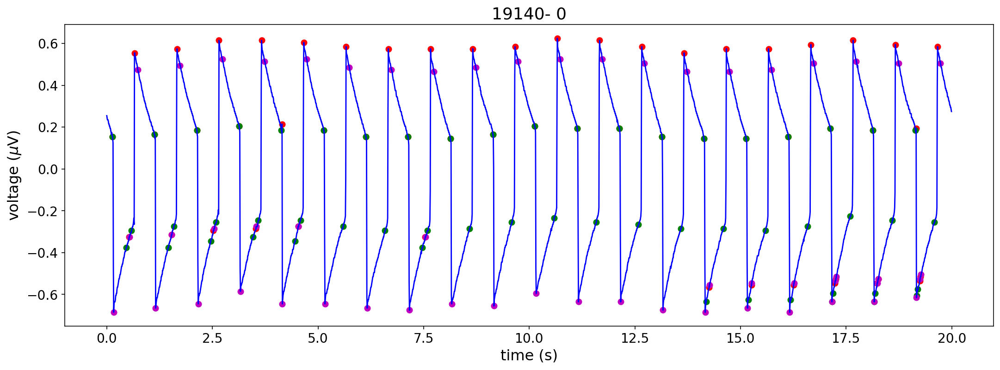

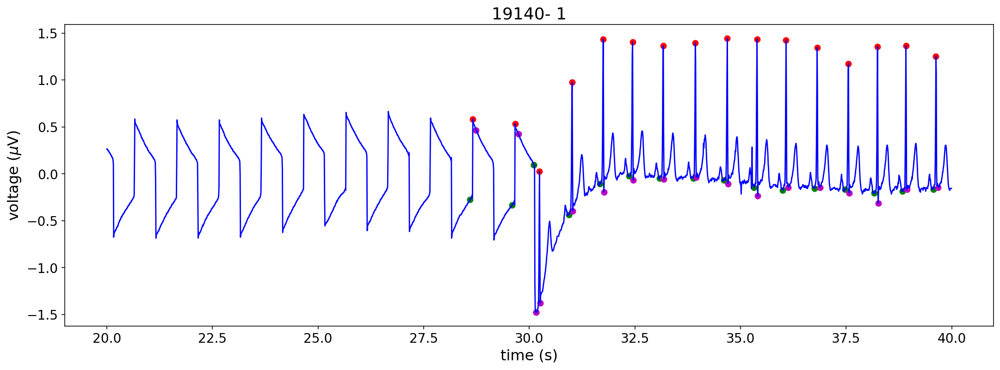

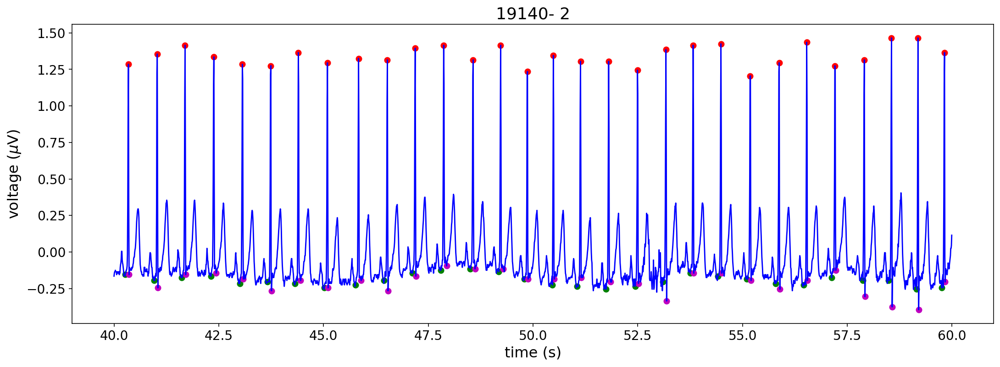

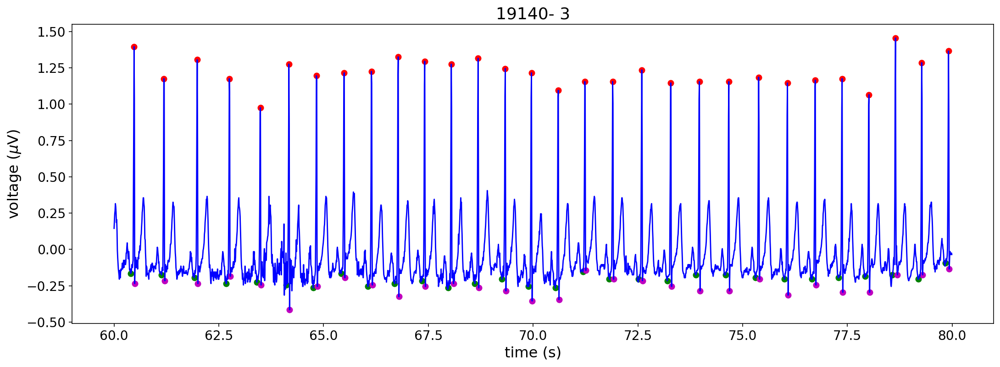

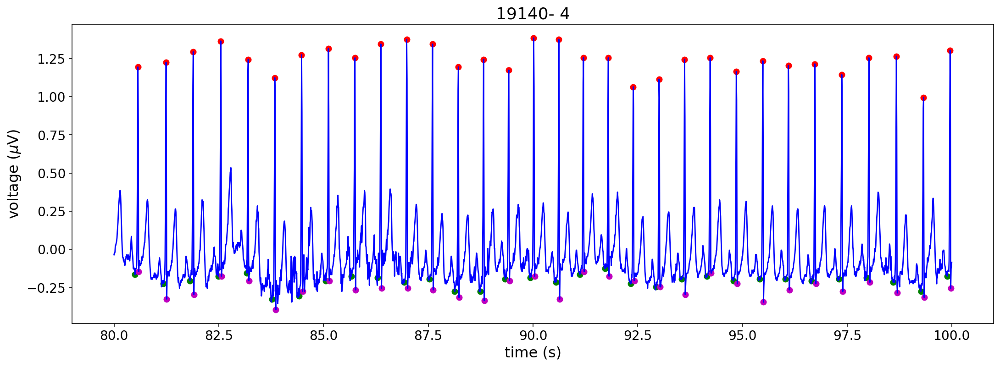

In [9]:
#All the files corresponding to normal patients are imported, graphed and analyzed
file=open("mit-bih-normal-sinus-rhythm-database-1.0.0/RECORDS","r")
a=file.read()
b=a.split(a[5])
b.pop()
b=np.array(b)
#Notice that some recordings were deleted 
rn=[[0.1,0.1,0.1,60,6,60,60]]
for record in b[0:17]:
    file="mit-bih-normal-sinus-rhythm-database-1.0.0/"+record
    rn=np.append(rn,R_fourier(file,5,35,threshold_ratio=0.6, ),axis=0)
rn=np.delete(rn,[0],axis=0)
rn=np.delete(rn,[5,11,24,26,37,40,42,57,60,61,62,63,65,66,70,71,74,75,76,80,81],axis=0)

In [10]:
#Now we print how many samples we have of each group
print(len(rn))
print(len(ra))

64
53


In [11]:
#We define a funtion that compares each variable from both groups in a histogram
def histogram(var, rn=rn,ra=ra):
    labels=["Mean QRS lenght (s)","Standard Deviation of QRS lenght (s)", "Max QRS lenght (s)", "Min QRS lenght (s)","Mean heart rate (s)","Standard deviation of heart rate (s)", "Max heart rate (s)", "Min heart rate (s)"]
    plt.figure(figsize=(18,6))
    plt.hist(rn[:,var],color="b", label="Normal", bins=30,density=True,alpha=0.5,histtype='stepfilled')
    plt.hist(ra[:,var],color="r", label="Arrythmia", bins=30,alpha=0.5,histtype='stepfilled', density=True)
    plt.legend()
    plt.title(labels[var],color="white")
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')
    plt.savefig("hist_"+str(var)+".png")
    plt.show;

In [12]:
#We define a function that graphs in a scatter plot any two variables and compares them
def compare_var(var1,var2,rn=rn,ra=ra):
    labels=["Mean QRS lenght (s)","Standard Deviation of QRS lenght (s)", "Max QRS lenght (s)", "Min QRS lenght (s)","Mean heart rate (s)","Standard deviation of heart rate (s)", "Max heart rate (s)", "Min heart rate (s)"]
    plt.figure(figsize=(18,6))
    plt.scatter(rn[:,var1],rn[:,var2],color='b',label="Normal")
    plt.scatter(ra[:,var1],ra[:,var2],color='r',label="Arrhythmia")
    plt.legend()
    plt.xlabel(labels[var1],color="white")
    plt.ylabel(labels[var2],color="white")
    plt.title(labels[var1]+" vs "+labels[var2],color="white")
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')
    plt.savefig("comp_"+str(var1)+"_"+str(var2)+".png")
    plt.show;

#A histogram is made for every variable
for i in range(0,7):
    histogram(i)

#A variable comparison is made for every combination of two variables. 
for a in range(0,7):
    for i in range(0,7):
        if i!=a:
            compare_var(a,i)

### Observations of the variables
Notice that for almost every variable there is a slight diference among the two groups except for one. Can you guess which one from the graphs? 

## Neural Network
First we will do some pre-processing of the obtained data. First we will need to mark each sample. A zero or a one will be appended to the array of variables, depending on whether it corresponds to a normal patient or a patient with arrythmia respectively. Then we need to shuffle them. If we don't shuffle our data, the samples from one patient will be together. This might result in a biased training. 

In [13]:
control=np.append(rn,np.zeros([len(rn),1]),axis=1)

In [14]:
arrythm=np.append(ra,np.ones([len(ra),1]),axis=1)

In [15]:
np.random.shuffle(control)
np.random.shuffle(arrythm)

In [16]:
print(np.shape(control))
print(np.shape(arrythm))

(64, 8)
(53, 8)


### Dividing training group vs test group 
Now we need to divide all of the data in train and test. The train sample will be used to otimize our network. The validation group will be used to evaluate the accuracy of the trained network. Why do you think we can't evaluate an algorithm with the same data we used to train it?

In [17]:
#The two sets are created with equal parts of normal samples and arrythmia samples.
train=np.append(control[:45],arrythm[:45],axis=0)
test=np.append(control[45:len(arrythm)],arrythm[45:],axis=0)
print(np.shape(train))

(90, 8)


In [18]:
#Then the training samples are shuffled to avoid a bias in the trainig.
np.random.shuffle(train)

In [19]:
#The variables are redivided. 
#"x" corresponds to the independent variables
#"y" corresponds to the dependent variable (arrythmia or normal)
train_x=train[:,:-1]
train_y=train[:,-1:]
test_x=test[:,:-1]
test_y=test[:,-1:]

In [20]:
print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)

(90, 7)
(90, 1)
(16, 7)
(16, 1)


In [21]:
#Now we import the modules needed to create the neural network
import pandas as pd
import seaborn as sn

In [22]:
from keras.models import Sequential
from keras.layers import Input, Dense, Flatten, Dropout
from keras.layers import Activation
from keras.optimizers import SGD
from keras.models import Model
from keras.utils import plot_model
from keras import initializers
from keras import optimizers
import tensorflow as tf

Using TensorFlow backend.


In [23]:
import networkx as nx

#We define a set of funtions needed to visualize the architechture of the network
class Network(object):
    
    def  __init__ (self,sizes):
        self.num_layers = len(sizes)
        print("It has", self.num_layers, "layers,")
        self.sizes = sizes
        print("with the following number of nodes per layer",self.sizes)
        self.biases = [np.random.randn(y, 1) for y in sizes[1:]]
        self.weights = [np.random.randn(y, x)
                        for x, y in zip(sizes[:-1], sizes[1:])]
        
    def feedforward(self, x_of_sample):
        """Return the output of the network F(x_of_sample) """        
        for b, w in zip(self.biases, self.weights):
            x_of_sample = sigmoid(np.dot(w, x_of_sample)+b)
        return x_of_sample
    
    def graph(self,sizes):
        a=[]
        ps={}
        Q = nx.Graph()
        for i in range(len(sizes)):
            Qi=nx.Graph()    
            n=sizes[i]
            nodos=np.arange(n)
            Qi.add_nodes_from(nodos)
            l_i=Qi.nodes
            Q = nx.union(Q, Qi, rename = (None, 'Q%i-'%i))
            if len(l_i)==1:
                ps['Q%i-0'%i]=[i/(len(sizes)), 1/2]
            else:
                for j in range(len(l_i)+1):
                    ps['Q%i-%i'%(i,j)]=[i/(len(sizes)),(1/(len(l_i)*len(l_i)))+(j/(len(l_i)))]
            a.insert(i,Qi)
        for i in range(len(a)-1):
            for j in range(len(a[i])):
                for k in range(len(a[i+1])):
                    Q.add_edge('Q%i-%i' %(i,j),'Q%i-%i' %(i+1,k))
        nx.draw(Q, pos = ps)
        plt.savefig("Arq.png")

In [24]:
#We define the numer of neurons in each layer. We cant change the numer of input or output neurons scince they correspond to the variables we already have.
n_x=7
n_h1=16
n_h2=8
n_y=1

#Graphical representation of the network
layers = [n_x,n_h1,n_h2,n_y]
net = Network(layers)
net.graph(layers)

In [25]:
#Now we define the functions of each layer
model = Sequential()

input_nodes = n_x     #input layer has n_x nodes
hlayer1_nodes = n_h1   #first hidden layer has n_h1 nodes
hlayer2_nodes = n_h2   #second hidden layer has n_h2 nodes
output_nodes = n_y    #output layer has n_y node


#For the first hidden layer, it is necessary to indicate its input layer, which corresponds to 
#the input layer of the network

model.add(Dense(hlayer1_nodes,  kernel_initializer='identity', bias_initializer='zeros', input_dim=input_nodes, activation='tanh'))

model.add(Dense(hlayer2_nodes,  kernel_initializer='identity', bias_initializer='zeros', input_dim=n_h1, activation='relu'))

#For any other hidden layer its input layer is not indicated. Its input layer is the hidden layer before it

#The following layer is the last layer of the network. It corresponds to the output layer of the network
model.add(Dense(output_nodes,activation='sigmoid'))


#A mental map of the dimentions of the array in each layer
plot_model(model, to_file='model.png', show_shapes=True, rankdir='TB', 
       show_layer_names=True)

model.summary()

In [26]:
# We define the optimizing function and their hyperparameters: learining rate(lr) in the present case
model.compile(loss='binary_crossentropy', optimizer=optimizers.adam(lr=0.001), metrics=['accuracy'])

In [27]:
validation_portion = 0.11
epochs = 500

#The network is trained 
history = model.fit(train_x, train_y, epochs=epochs, validation_split = validation_portion)

Train on 80 samples, validate on 10 samples
Epoch 1/500
80/80 [==============================] - 5s 62ms/step - loss: 0.9780 - accuracy: 0.4750 - val_loss: 0.6387 - val_accuracy: 0.7000
Epoch 2/500
80/80 [==============================] - 0s 256us/step - loss: 0.9506 - accuracy: 0.4750 - val_loss: 0.6279 - val_accuracy: 0.7000
Epoch 3/500
80/80 [==============================] - 0s 477us/step - loss: 0.9321 - accuracy: 0.4750 - val_loss: 0.6203 - val_accuracy: 0.7000
Epoch 4/500
80/80 [==============================] - 0s 289us/step - loss: 0.9082 - accuracy: 0.4750 - val_loss: 0.6179 - val_accuracy: 0.7000
Epoch 5/500
80/80 [==============================] - 0s 244us/step - loss: 0.8905 - accuracy: 0.4750 - val_loss: 0.6102 - val_accuracy: 0.7000
Epoch 6/500
80/80 [==============================] - 0s 341us/step - loss: 0.8704 - accuracy: 0.4750 - val_loss: 0.6024 - val_accuracy: 0.7000
Epoch 7/500
80/80 [==============================] - 0s 263us/step - loss: 0.8522 - accuracy: 0.475

80/80 [==============================] - 0s 253us/step - loss: 0.6716 - accuracy: 0.4750 - val_loss: 0.6530 - val_accuracy: 0.7000
Epoch 58/500
80/80 [==============================] - 0s 331us/step - loss: 0.6707 - accuracy: 0.4750 - val_loss: 0.6526 - val_accuracy: 0.7000
Epoch 59/500
80/80 [==============================] - 0s 272us/step - loss: 0.6700 - accuracy: 0.4750 - val_loss: 0.6529 - val_accuracy: 0.7000
Epoch 60/500
80/80 [==============================] - 0s 334us/step - loss: 0.6692 - accuracy: 0.4750 - val_loss: 0.6533 - val_accuracy: 0.7000
Epoch 61/500
80/80 [==============================] - 0s 301us/step - loss: 0.6685 - accuracy: 0.4750 - val_loss: 0.6531 - val_accuracy: 0.7000
Epoch 62/500
80/80 [==============================] - 0s 250us/step - loss: 0.6675 - accuracy: 0.4750 - val_loss: 0.6526 - val_accuracy: 0.7000
Epoch 63/500
80/80 [==============================] - 0s 305us/step - loss: 0.6668 - accuracy: 0.4750 - val_loss: 0.6515 - val_accuracy: 0.7000
Epoch

Epoch 114/500
80/80 [==============================] - 0s 503us/step - loss: 0.6174 - accuracy: 0.6625 - val_loss: 0.6567 - val_accuracy: 0.5000
Epoch 115/500
80/80 [==============================] - 0s 431us/step - loss: 0.6161 - accuracy: 0.6875 - val_loss: 0.6515 - val_accuracy: 0.5000
Epoch 116/500
80/80 [==============================] - 0s 348us/step - loss: 0.6155 - accuracy: 0.6750 - val_loss: 0.6462 - val_accuracy: 0.5000
Epoch 117/500
80/80 [==============================] - 0s 394us/step - loss: 0.6170 - accuracy: 0.6750 - val_loss: 0.6470 - val_accuracy: 0.5000
Epoch 118/500
80/80 [==============================] - 0s 378us/step - loss: 0.6153 - accuracy: 0.6750 - val_loss: 0.6475 - val_accuracy: 0.5000
Epoch 119/500
80/80 [==============================] - 0s 436us/step - loss: 0.6146 - accuracy: 0.6875 - val_loss: 0.6477 - val_accuracy: 0.5000
Epoch 120/500
80/80 [==============================] - 0s 373us/step - loss: 0.6142 - accuracy: 0.6875 - val_loss: 0.6469 - val_ac

80/80 [==============================] - 0s 555us/step - loss: 0.6000 - accuracy: 0.7000 - val_loss: 0.6542 - val_accuracy: 0.5000
Epoch 171/500
80/80 [==============================] - 0s 295us/step - loss: 0.6037 - accuracy: 0.6500 - val_loss: 0.6566 - val_accuracy: 0.5000
Epoch 172/500
80/80 [==============================] - 0s 578us/step - loss: 0.6022 - accuracy: 0.6500 - val_loss: 0.6486 - val_accuracy: 0.5000
Epoch 173/500
80/80 [==============================] - 0s 361us/step - loss: 0.6010 - accuracy: 0.6750 - val_loss: 0.6329 - val_accuracy: 0.5000
Epoch 174/500
80/80 [==============================] - 0s 218us/step - loss: 0.6003 - accuracy: 0.6750 - val_loss: 0.6301 - val_accuracy: 0.5000
Epoch 175/500
80/80 [==============================] - 0s 269us/step - loss: 0.5986 - accuracy: 0.6750 - val_loss: 0.6413 - val_accuracy: 0.5000
Epoch 176/500
80/80 [==============================] - 0s 219us/step - loss: 0.5980 - accuracy: 0.6750 - val_loss: 0.6447 - val_accuracy: 0.5000

80/80 [==============================] - 0s 681us/step - loss: 0.5891 - accuracy: 0.6750 - val_loss: 0.6324 - val_accuracy: 0.5000
Epoch 227/500
80/80 [==============================] - 0s 426us/step - loss: 0.5868 - accuracy: 0.6875 - val_loss: 0.6335 - val_accuracy: 0.5000
Epoch 228/500
80/80 [==============================] - 0s 2ms/step - loss: 0.5886 - accuracy: 0.6750 - val_loss: 0.6402 - val_accuracy: 0.5000
Epoch 229/500
80/80 [==============================] - 0s 350us/step - loss: 0.5883 - accuracy: 0.6750 - val_loss: 0.6385 - val_accuracy: 0.5000
Epoch 230/500
80/80 [==============================] - 0s 371us/step - loss: 0.5865 - accuracy: 0.6875 - val_loss: 0.6302 - val_accuracy: 0.5000
Epoch 231/500
80/80 [==============================] - 0s 496us/step - loss: 0.5861 - accuracy: 0.6875 - val_loss: 0.6275 - val_accuracy: 0.5000
Epoch 232/500
80/80 [==============================] - 0s 400us/step - loss: 0.5864 - accuracy: 0.6875 - val_loss: 0.6310 - val_accuracy: 0.5000
E

Epoch 283/500
80/80 [==============================] - 0s 452us/step - loss: 0.5844 - accuracy: 0.6875 - val_loss: 0.6634 - val_accuracy: 0.5000
Epoch 284/500
80/80 [==============================] - 0s 488us/step - loss: 0.5846 - accuracy: 0.6875 - val_loss: 0.6703 - val_accuracy: 0.5000
Epoch 285/500
80/80 [==============================] - 0s 568us/step - loss: 0.5869 - accuracy: 0.6750 - val_loss: 0.6777 - val_accuracy: 0.4000
Epoch 286/500
80/80 [==============================] - 0s 450us/step - loss: 0.5888 - accuracy: 0.6625 - val_loss: 0.6774 - val_accuracy: 0.5000
Epoch 287/500
80/80 [==============================] - 0s 358us/step - loss: 0.5883 - accuracy: 0.6625 - val_loss: 0.6732 - val_accuracy: 0.5000
Epoch 288/500
80/80 [==============================] - 0s 735us/step - loss: 0.5862 - accuracy: 0.6875 - val_loss: 0.6670 - val_accuracy: 0.5000
Epoch 289/500
80/80 [==============================] - 0s 548us/step - loss: 0.5882 - accuracy: 0.6875 - val_loss: 0.6628 - val_ac

/Users/javierserranomolina/miniconda3/envs/IA/lib/python3.7/site-packages/keras/callbacks/callbacks.py:95: RuntimeWarning: Method (on_train_batch_end) is slow compared to the batch update (0.103056). Check your callbacks.
  % (hook_name, delta_t_median), RuntimeWarning)


80/80 [==============================] - 0s 702us/step - loss: 0.5639 - accuracy: 0.7250 - val_loss: 0.6183 - val_accuracy: 0.5000
Epoch 322/500
80/80 [==============================] - 0s 2ms/step - loss: 0.5593 - accuracy: 0.7250 - val_loss: 0.5707 - val_accuracy: 0.8000
Epoch 323/500
80/80 [==============================] - 0s 667us/step - loss: 0.5560 - accuracy: 0.7750 - val_loss: 0.5630 - val_accuracy: 0.7000
Epoch 324/500
80/80 [==============================] - 0s 1ms/step - loss: 0.5612 - accuracy: 0.7250 - val_loss: 0.5930 - val_accuracy: 0.8000
Epoch 325/500
80/80 [==============================] - 0s 1ms/step - loss: 0.5623 - accuracy: 0.7250 - val_loss: 0.6250 - val_accuracy: 0.6000
Epoch 326/500
80/80 [==============================] - 0s 473us/step - loss: 0.5607 - accuracy: 0.7125 - val_loss: 0.6119 - val_accuracy: 0.6000
Epoch 327/500
80/80 [==============================] - 0s 487us/step - loss: 0.5542 - accuracy: 0.7375 - val_loss: 0.5806 - val_accuracy: 0.8000
Epoch

/Users/javierserranomolina/miniconda3/envs/IA/lib/python3.7/site-packages/keras/callbacks/callbacks.py:95: RuntimeWarning: Method (on_train_batch_end) is slow compared to the batch update (0.115933). Check your callbacks.
  % (hook_name, delta_t_median), RuntimeWarning)


80/80 [==============================] - 0s 2ms/step - loss: 0.5601 - accuracy: 0.6875 - val_loss: 0.6178 - val_accuracy: 0.5000
Epoch 332/500
80/80 [==============================] - 0s 558us/step - loss: 0.5630 - accuracy: 0.7250 - val_loss: 0.5744 - val_accuracy: 0.8000
Epoch 333/500
80/80 [==============================] - 0s 575us/step - loss: 0.5534 - accuracy: 0.7375 - val_loss: 0.5755 - val_accuracy: 0.8000
Epoch 334/500
80/80 [==============================] - 0s 2ms/step - loss: 0.5524 - accuracy: 0.8125 - val_loss: 0.5809 - val_accuracy: 0.7000
Epoch 335/500
80/80 [==============================] - 0s 504us/step - loss: 0.5574 - accuracy: 0.7750 - val_loss: 0.5892 - val_accuracy: 0.8000
Epoch 336/500
80/80 [==============================] - 0s 480us/step - loss: 0.5526 - accuracy: 0.7125 - val_loss: 0.5741 - val_accuracy: 0.8000
Epoch 337/500
80/80 [==============================] - 0s 448us/step - loss: 0.5504 - accuracy: 0.7500 - val_loss: 0.5463 - val_accuracy: 0.7000
Epo

Epoch 388/500
80/80 [==============================] - 0s 719us/step - loss: 0.5338 - accuracy: 0.7375 - val_loss: 0.5961 - val_accuracy: 0.6000
Epoch 389/500
80/80 [==============================] - 0s 2ms/step - loss: 0.5452 - accuracy: 0.7250 - val_loss: 0.5522 - val_accuracy: 0.8000
Epoch 390/500
80/80 [==============================] - 0s 335us/step - loss: 0.5295 - accuracy: 0.7875 - val_loss: 0.5491 - val_accuracy: 0.8000
Epoch 391/500
80/80 [==============================] - 0s 390us/step - loss: 0.5286 - accuracy: 0.8000 - val_loss: 0.5346 - val_accuracy: 0.8000
Epoch 392/500
80/80 [==============================] - 0s 396us/step - loss: 0.5298 - accuracy: 0.7875 - val_loss: 0.5555 - val_accuracy: 0.8000
Epoch 393/500
80/80 [==============================] - 0s 422us/step - loss: 0.5302 - accuracy: 0.7875 - val_loss: 0.5417 - val_accuracy: 0.8000
Epoch 394/500
80/80 [==============================] - 0s 481us/step - loss: 0.5260 - accuracy: 0.8000 - val_loss: 0.5646 - val_accu

80/80 [==============================] - 0s 585us/step - loss: 0.5172 - accuracy: 0.7375 - val_loss: 0.5716 - val_accuracy: 0.8000
Epoch 445/500
80/80 [==============================] - 0s 412us/step - loss: 0.5196 - accuracy: 0.7500 - val_loss: 0.5553 - val_accuracy: 0.8000
Epoch 446/500
80/80 [==============================] - 0s 1ms/step - loss: 0.5204 - accuracy: 0.7500 - val_loss: 0.5055 - val_accuracy: 0.8000
Epoch 447/500
80/80 [==============================] - 0s 378us/step - loss: 0.5175 - accuracy: 0.7500 - val_loss: 0.5305 - val_accuracy: 0.8000
Epoch 448/500
80/80 [==============================] - 0s 543us/step - loss: 0.5131 - accuracy: 0.7750 - val_loss: 0.5801 - val_accuracy: 0.7000
Epoch 449/500
80/80 [==============================] - 0s 363us/step - loss: 0.5250 - accuracy: 0.7250 - val_loss: 0.5636 - val_accuracy: 0.8000
Epoch 450/500
80/80 [==============================] - 0s 337us/step - loss: 0.5204 - accuracy: 0.7750 - val_loss: 0.5007 - val_accuracy: 0.8000
E

80/80 [==============================] - 0s 490us/step - loss: 0.4986 - accuracy: 0.7750 - val_loss: 0.5592 - val_accuracy: 0.7000


## Development of the network in each epoch

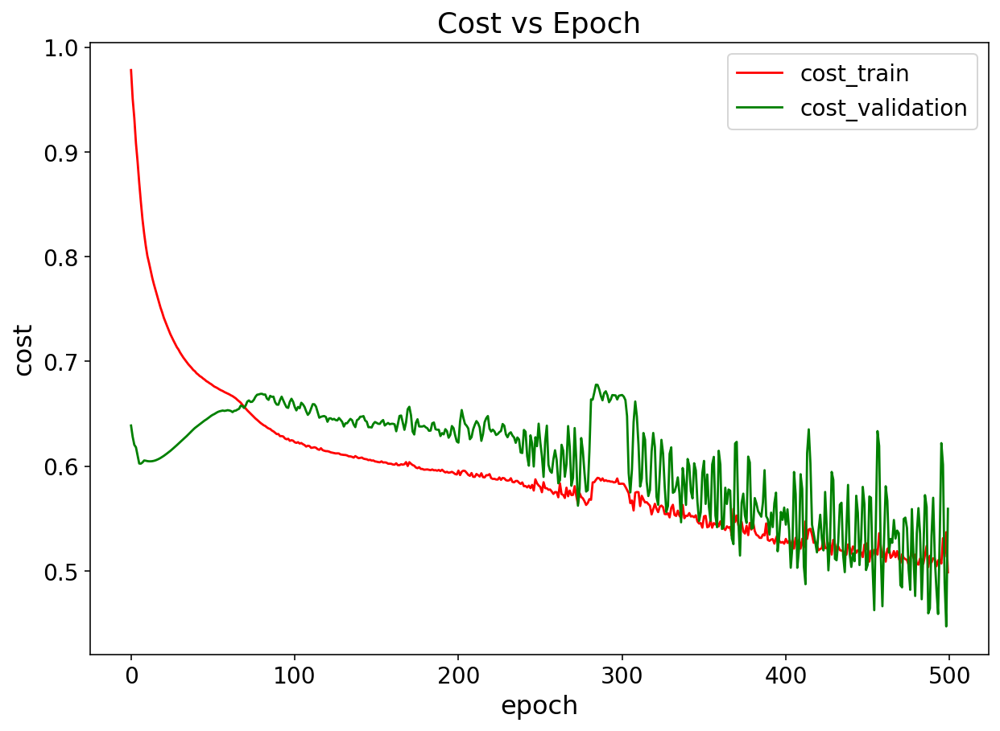

In [28]:
#Cost function in every epoch
plt.figure(figsize=(10, 7))
color="black"
plt.plot(history.history['loss'], color='red')
plt.plot(history.history['val_loss'], color='green')
plt.title('Cost vs Epoch', color=color)
plt.ylabel('cost',color=color)
plt.xlabel('epoch',color=color)
plt.legend(['cost_train', 'cost_validation'])

plt.tick_params(axis='x', colors=color)
plt.tick_params(axis='y', colors=color)
#plt.savefig("Build.png")
plt.show()

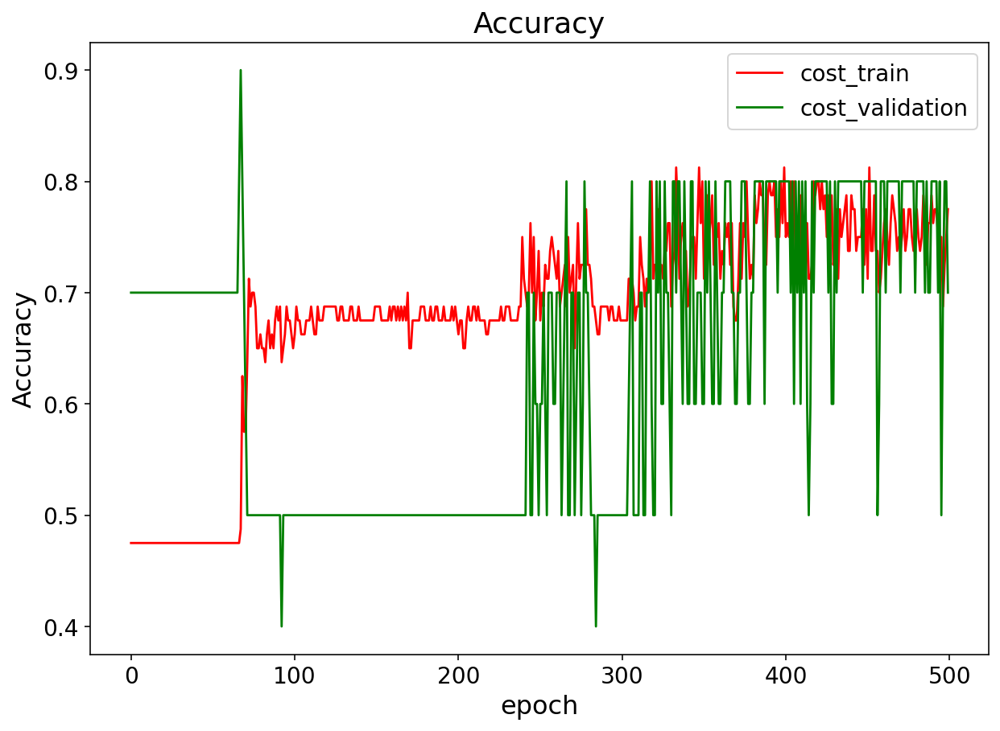

In [29]:
# Accuracy vs epoch
plt.figure(figsize=(10, 7))

plt.plot(history.history['accuracy'], color='red')
plt.plot(history.history['val_accuracy'], color='green')
plt.title('Accuracy', color=color)
plt.ylabel('Accuracy', color=color)
plt.xlabel('epoch', color=color)
plt.legend(['cost_train', 'cost_validation'])
plt.tick_params(axis='x', colors=color)
plt.tick_params(axis='y', colors=color)
#plt.savefig("Acuracy.png")
plt.show()

## Interpretation of the cost vs epoch graphs
To evaluate the chosen architecture there is a validation group. Now we will see how to know if you chose the right architecture for the fenomena you are trying to predict.

One of the most common mistakes in AI training is over-adjustments. You can notice an overadjustment when the "train" group keeps being optimized but the "validation" group doesn't. In the following graph you can observe an example of an overadjustment:

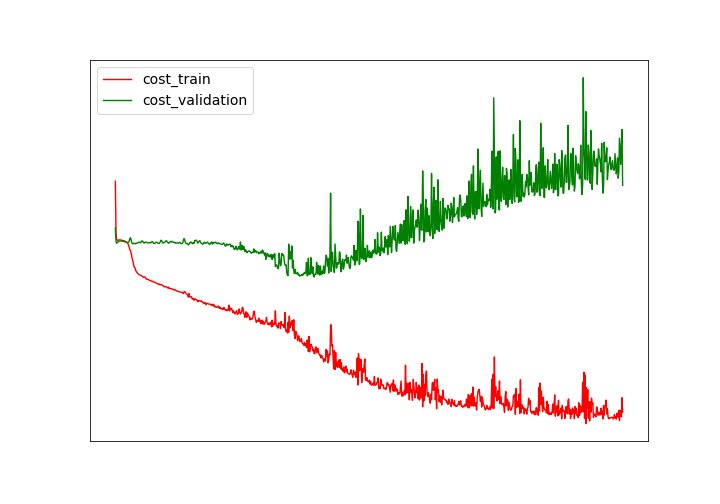

How to solve an overadjustment:
- Simplify the architecture of the algorithm
- Add a dropout layer. This is a layer in which every neuron has a chance to disapear. This forcesthe remaining neurons to become more representative. 
- Reduce the number of epochs in the epoch in which the two lines start to diverge. 

In an ideal case the two lines would go down together and in the end of the graph the optimization would start to decrease. If both lines keep decreasing, the algorithm needs more epochs and the results would improve. In the following graph you can observe how the algoritm reaches a local minimum in the cost function after aproximately 70 epochs:

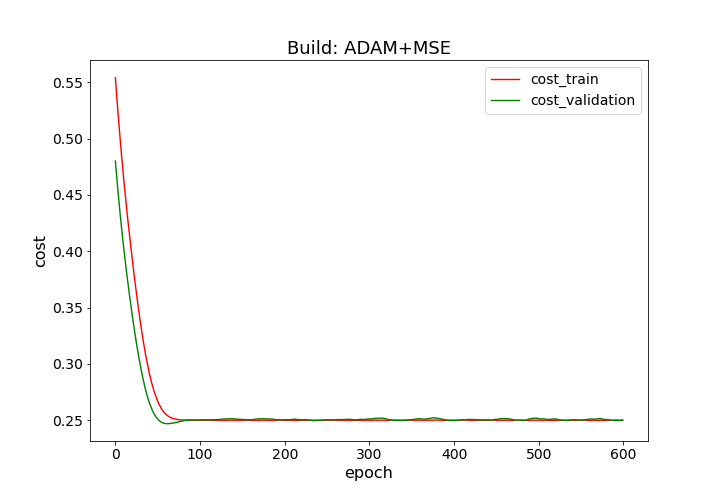

If the final accuracy isn't acceptable or the cost function stops decreasing, we want to reduce the number of epochs, reduce the learning rate or increase the complexity of the neural network. 

Too much complexity leads to an over-adjustment, while a lack of complexity results in the network not properly adapting to the phenomena. The architecture must be changed until a balance is achived. 

## Evaluation

In [30]:
#The condition of each sample is predicted using the trained network
prediction = model.predict(test_x)

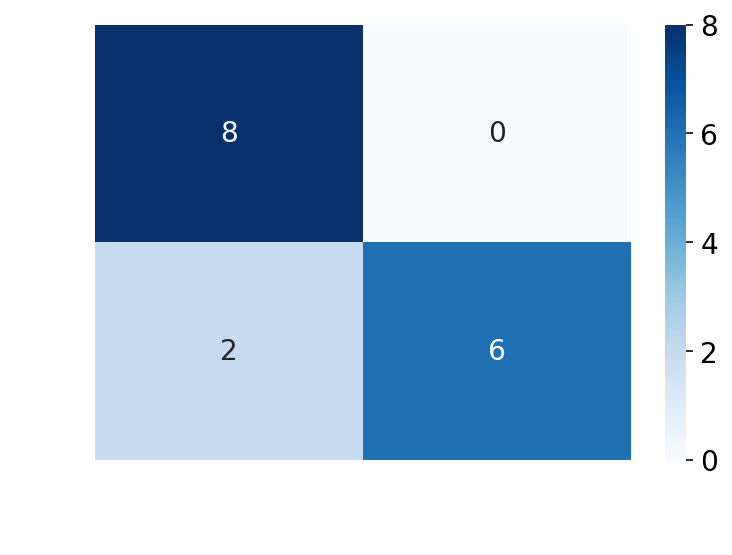

In [31]:
#A confution matrix is made to compare the predicted condition vs the actual condition
confusion_matrix = pd.crosstab(test_y[:,0], np.rint(prediction)[:,0], rownames=['Actual'], colnames=['Predicted'])

sn.heatmap(confusion_matrix, annot=True,cmap='Blues',xticklabels=["Normal","Arrythmia"],yticklabels=["Normal","Arrythmia"],color="white")

plt.tick_params(axis='x', colors='white')
plt.xlabel("Predicted",color="white")
plt.ylabel("Actual",color="white")
plt.tick_params(axis='y', colors='white')
plt.savefig("confusion.png")
plt.show()


In [32]:
13/16

0.8125